In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()

In [188]:
def plot_ppl(ppl_diff_fnl, M, A):
    
    fig, axes = plt.subplots(int(len(ppl_diff_fnl)/2)+1, 2, figsize=(25, 10))
    axes = axes.ravel()
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
    for i, dong in enumerate(ppl_diff_fnl.index):
        ppl_dong_Mar = ppl[(ppl['행정동코드'] == dong) & (ppl['기준일ID'] == M)]
        ppl_dong_Apr = ppl[(ppl['행정동코드'] == dong) & (ppl['기준일ID'] == A)]
        ppl_dong_3 = ppl_dong_Mar[['시간대구분', '총생활인구수']].set_index('시간대구분')
        ppl_dong_4 = ppl_dong_Apr[['시간대구분', '총생활인구수']].set_index('시간대구분')
        axes[i].plot(ppl_dong_3)
        axes[i].plot(ppl_dong_4)
        axes[i].legend(['Mar', 'Apr'], loc='upper right')
        axes[i].title.set_text(loc_code[loc_code['행정동코드_'] == dong]['행정동명_'].values[0])
        axes[i].set_xlabel('time')
        axes[i].set_ylabel('ppl')
        plt.tight_layout()

In [3]:
def ppl_diff_(M, A):

    ppl_M = ppl[ppl['기준일ID']== M]
    ppl_M = ppl_M[(ppl_M['시간대구분']>=18) & (ppl_M['시간대구분']<=21)]
    ppl_M = ppl_M.groupby('행정동코드')['총생활인구수'].agg(sum)

    ppl_A = ppl[ppl['기준일ID']== A]
    ppl_A = ppl_A[(ppl_A['시간대구분']>=18) & (ppl_A['시간대구분']<=21)]
    ppl_A = ppl_A.groupby('행정동코드')['총생활인구수'].agg(sum)

    ppl_diff = (ppl_A - ppl_M).sort_values(ascending=False)

    # ppl_diff 에서 상위 0.05% 안에 드는 행정동 추출
    ppl_diff_MA = ppl_diff[:21]
    
    return ppl_diff_MA

In [4]:
def ppl_map(df, ppl_diff_fnl):
    center = [37.541, 126.986] # 맵이 center 에 위치하고, zoom 레벨은 11로 시작하는 맵 m을 만듭니다. 
    m = folium.Map(location=center, zoom_start=10) # Choropleth 레이어를 만들고, 맵 m에 추가합니다. 
    folium.Choropleth( geo_data=df, data=ppl_diff_fnl, columns=('행정동코드', '총생활인구수'), key_on='feature.properties.행정동코드', fill_color='PuRd', legend_name='총생활인구수').add_to(m)
    
    # 맵 m을 출력합니다.

    return m

## 행정동 코드 전처리

In [5]:
loc_code = pd.read_csv('dataset/LOCAL_PEOPLE_DONG_201904/code.csv', encoding='euc-kr')
loc_code['시군구코드'] = loc_code['시군구코드'].astype(str)
loc_code['행정동코드'] = loc_code['행정동코드'].astype(str)
loc_code['행정동코드_'] = loc_code['시군구코드'] + loc_code['행정동코드']
loc_code = loc_code[loc_code['시도명'] == '서울특별시']
loc_code = loc_code[loc_code['행정동명'].isna() == False]
loc_code = loc_code[['행정동코드_', '시도명', '시군구명', '행정동명']]
loc_code['행정동명_'] = loc_code['시도명'] + ' ' + loc_code['시군구명'] + ' ' + loc_code['행정동명']
loc_code = loc_code[['시군구명', '행정동코드_', '행정동명_']]
loc_code = loc_code.drop_duplicates()
loc_code.isna().sum()

시군구명      0
행정동코드_    0
행정동명_     0
dtype: int64

In [6]:
loc_code['행정동코드_'] = loc_code['행정동코드_'].astype('int64')
loc_code['시군구코드'] = loc_code['행정동코드_'].astype(str).str.slice(0,5)

## Geojson 불러오기

In [7]:
df = gpd.read_file('dataset/map/seoul-dong.geojson')
df.head()

,시,구,동,행정동코드,geometry
0,서울특별시,종로구,사직동,11110530,"MULTIPOLYGON (((126.97689 37.57565, 126.97703 ..."
1,서울특별시,종로구,삼청동,11110540,"MULTIPOLYGON (((126.98269 37.59507, 126.98337 ..."
2,서울특별시,종로구,부암동,11110550,"MULTIPOLYGON (((126.97585 37.59656, 126.97359 ..."
3,서울특별시,종로구,평창동,11110560,"MULTIPOLYGON (((126.97507 37.63139, 126.97649 ..."
4,서울특별시,종로구,무악동,11110570,"MULTIPOLYGON (((126.96067 37.58080, 126.96281 ..."


## 2003 / 2004 생활인구 데이터 불러오기

#### 20년 3월 데이터

In [8]:
ppl_2003 = pd.read_csv('dataset/LOCAL_PEOPLE_DONG_202003.csv')

# Fixing the index

col_names = ppl_2003.columns
ppl_2003 = ppl_2003.reset_index()
ppl_2003 = ppl_2003.iloc[:,:len(col_names)]
ppl_2003.columns = col_names
ppl_2003_ = ppl_2003.copy().round().astype('int64')

ppl_2003_.head()

,기준일ID,시간대구분,행정동코드,총생활인구수,남자0세부터9세생활인구수,남자10세부터14세생활인구수,남자15세부터19세생활인구수,남자20세부터24세생활인구수,남자25세부터29세생활인구수,남자30세부터34세생활인구수,...,여자25세부터29세생활인구수,여자30세부터34세생활인구수,여자35세부터39세생활인구수,여자40세부터44세생활인구수,여자45세부터49세생활인구수,여자50세부터54세생활인구수,여자55세부터59세생활인구수,여자60세부터64세생활인구수,여자65세부터69세생활인구수,여자70세이상생활인구수
0,20200301,0,11110515,14314,522,333,441,688,508,419,...,464,468,612,679,730,644,536,429,375,1108
1,20200301,0,11140520,5366,153,22,50,192,294,388,...,262,289,277,213,193,152,122,118,74,107
2,20200301,0,11140540,6986,98,41,85,228,266,395,...,261,256,321,256,264,217,232,238,199,374
3,20200301,0,11140550,6926,125,38,80,227,368,412,...,307,274,317,177,278,194,174,157,131,351
4,20200301,0,11140570,5446,95,32,136,342,306,246,...,309,212,175,113,176,172,196,200,96,375


In [9]:
# 결측치 확인

ppl_2003_.isna().sum()

기준일ID              0
시간대구분              0
행정동코드              0
총생활인구수             0
남자0세부터9세생활인구수      0
남자10세부터14세생활인구수    0
남자15세부터19세생활인구수    0
남자20세부터24세생활인구수    0
남자25세부터29세생활인구수    0
남자30세부터34세생활인구수    0
남자35세부터39세생활인구수    0
남자40세부터44세생활인구수    0
남자45세부터49세생활인구수    0
남자50세부터54세생활인구수    0
남자55세부터59세생활인구수    0
남자60세부터64세생활인구수    0
남자65세부터69세생활인구수    0
남자70세이상생활인구수       0
여자0세부터9세생활인구수      0
여자10세부터14세생활인구수    0
여자15세부터19세생활인구수    0
여자20세부터24세생활인구수    0
여자25세부터29세생활인구수    0
여자30세부터34세생활인구수    0
여자35세부터39세생활인구수    0
여자40세부터44세생활인구수    0
여자45세부터49세생활인구수    0
여자50세부터54세생활인구수    0
여자55세부터59세생활인구수    0
여자60세부터64세생활인구수    0
여자65세부터69세생활인구수    0
여자70세이상생활인구수       0
dtype: int64

#### 20년 4월 데이터

In [10]:
ppl_2004 = pd.read_csv('dataset/LOCAL_PEOPLE_DONG_202004.csv', encoding='euc-kr')
ppl_2004_ = ppl_2004.copy().round().astype('int64')

# 3월을 제외한 4월 데이터만 추출

ppl_2004_ = ppl_2004_[ppl_2004_['기준일ID']>20200331]
ppl_2004_ = ppl_2004_.sort_values(by=['기준일ID'], ascending=True)
ppl_2004_.head()

,기준일ID,시간대구분,행정동코드,총생활인구수,남자0세부터9세생활인구수,남자10세부터14세생활인구수,남자15세부터19세생활인구수,남자20세부터24세생활인구수,남자25세부터29세생활인구수,남자30세부터34세생활인구수,...,여자25세부터29세생활인구수,여자30세부터34세생활인구수,여자35세부터39세생활인구수,여자40세부터44세생활인구수,여자45세부터49세생활인구수,여자50세부터54세생활인구수,여자55세부터59세생활인구수,여자60세부터64세생활인구수,여자65세부터69세생활인구수,여자70세이상생활인구수
91583,20200401,23,11740700,33865,1181,596,958,908,1074,1203,...,1194,1121,1282,1289,1347,1385,1568,1421,1176,2626
84802,20200401,8,11110540,6230,79,60,122,417,230,381,...,181,252,269,224,192,194,230,192,171,325
84801,20200401,8,11110530,30394,417,185,237,623,1224,1692,...,1749,1799,1666,1374,1333,976,927,841,533,1572
84800,20200401,8,11110515,16544,531,338,441,711,775,695,...,566,630,743,729,677,658,645,421,378,1075
84799,20200401,7,11740700,33672,1192,601,926,911,1101,1264,...,1233,1165,1250,1343,1420,1383,1584,1374,1153,2551


In [11]:
# 결측치 확인

ppl_2004_.isna().sum()

기준일ID              0
시간대구분              0
행정동코드              0
총생활인구수             0
남자0세부터9세생활인구수      0
남자10세부터14세생활인구수    0
남자15세부터19세생활인구수    0
남자20세부터24세생활인구수    0
남자25세부터29세생활인구수    0
남자30세부터34세생활인구수    0
남자35세부터39세생활인구수    0
남자40세부터44세생활인구수    0
남자45세부터49세생활인구수    0
남자50세부터54세생활인구수    0
남자55세부터59세생활인구수    0
남자60세부터64세생활인구수    0
남자65세부터69세생활인구수    0
남자70세이상생활인구수       0
여자0세부터9세생활인구수      0
여자10세부터14세생활인구수    0
여자15세부터19세생활인구수    0
여자20세부터24세생활인구수    0
여자25세부터29세생활인구수    0
여자30세부터34세생활인구수    0
여자35세부터39세생활인구수    0
여자40세부터44세생활인구수    0
여자45세부터49세생활인구수    0
여자50세부터54세생활인구수    0
여자55세부터59세생활인구수    0
여자60세부터64세생활인구수    0
여자65세부터69세생활인구수    0
여자70세이상생활인구수       0
dtype: int64

## 2003 과 2004 concat

In [12]:
ppl = pd.concat([ppl_2003_, ppl_2004_])
ppl = ppl.sort_values(by=['기준일ID', '시간대구분'])
ppl['시군구코드'] = ppl['행정동코드'].astype(str).str.slice(0,5)
ppl['행정동코드_'] = ppl['행정동코드'].astype(str).str.slice(5,)

## 20년도 3월 대비 4월에 생활인구가 증가하는 행정동 시각화
 - 오후 6시 ~ 9시 사이 생활인구 수를 비교, 그 차이가 큰 행정동 상위 0.05% 생활인구 위치 및 추이 확인
 - 추가할 내용 : 구별 생활인구 변화가 가장 큰 행정동 하나만 plot 해볼 것

#### 3월/4월 1주차 수요일 시간대별 생활인구 비교
 - 오후 6시 ~ 9시 사이 생활인구 수를 비교, 그 차이가 큰 행정동 상위 0.05% 생활인구 위치 및 추이 확인

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 51652 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 51088 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50577 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52488 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52488 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 47560 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 44368 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 47560 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 44368 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 47560 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 44368 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 51116 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49688 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48152 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 44540 missing from current font.
  font.set_text(s, 0.0, flags=flags)


C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49436 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 50872 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 53945 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backe

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 52824 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:180: RuntimeWarning: Glyph 45824 missing from current font.
  font.set_text(s, 0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:180: RuntimeWarning: Glyph 52824 missing from current font.
  font.set_text(s, 0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 47560 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\matplotlib\backends\

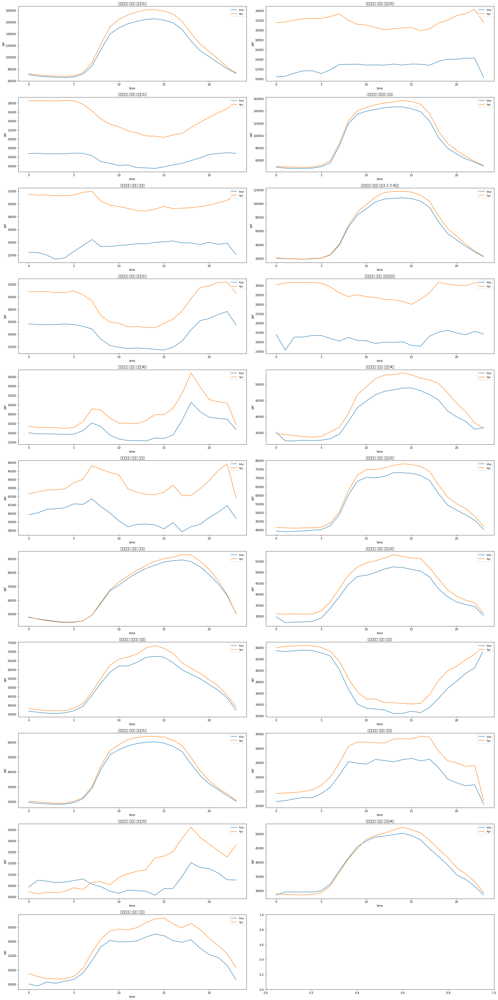

In [13]:
M = 20200304
A = 20200401

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 1주차 목요일 시간대별 생활인구 비교

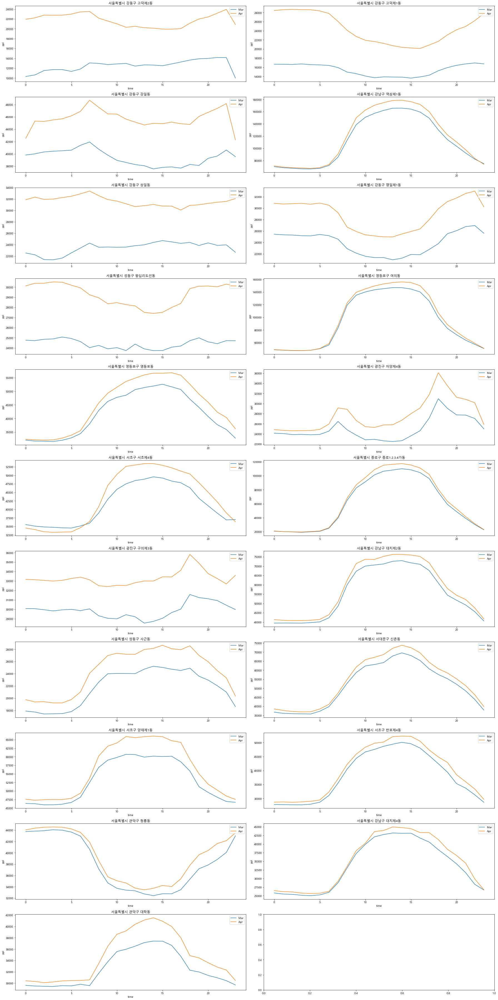

In [14]:
M = 20200305
A = 20200402

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 1주차 금요일 시간대별 생활인구 비교

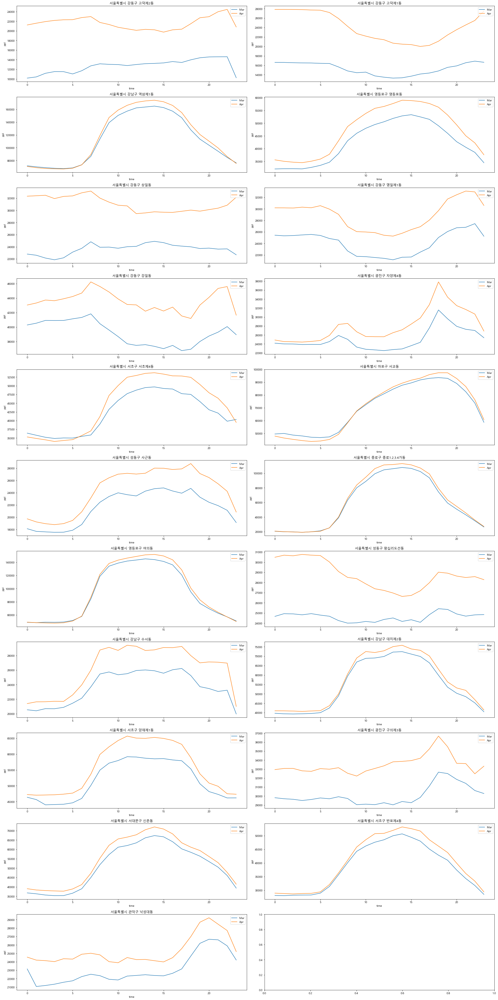

In [15]:
M = 20200306
A = 20200403

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 1주차 토요일 시간대별 생활인구 비교

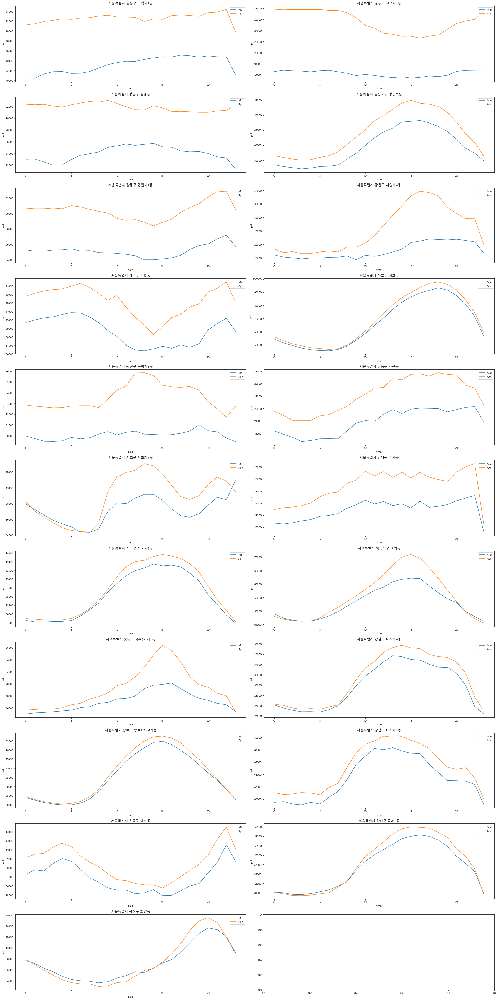

In [16]:
M = 20200307
A = 20200404

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 1주차 일요일 시간대별 생활인구 비교

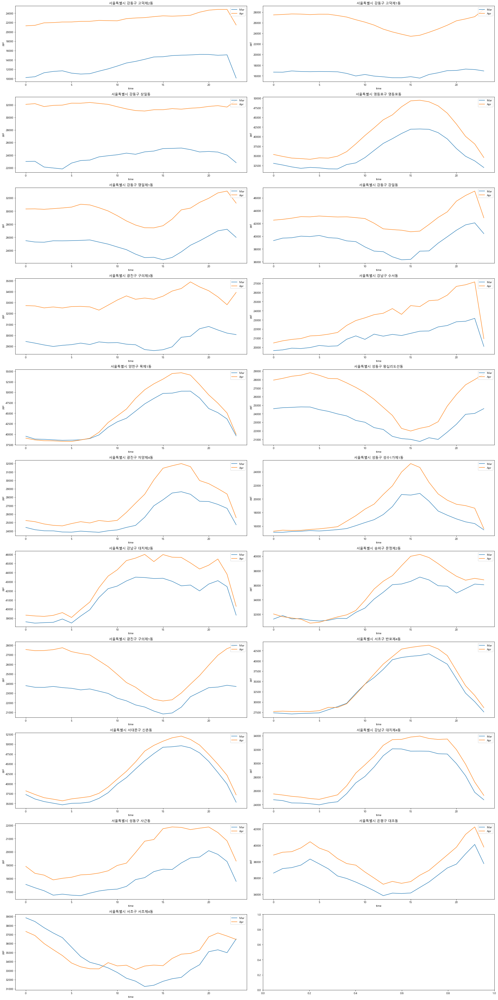

In [17]:
M = 20200308
A = 20200405

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 2주차 월요일 시간대별 생활인구 비교

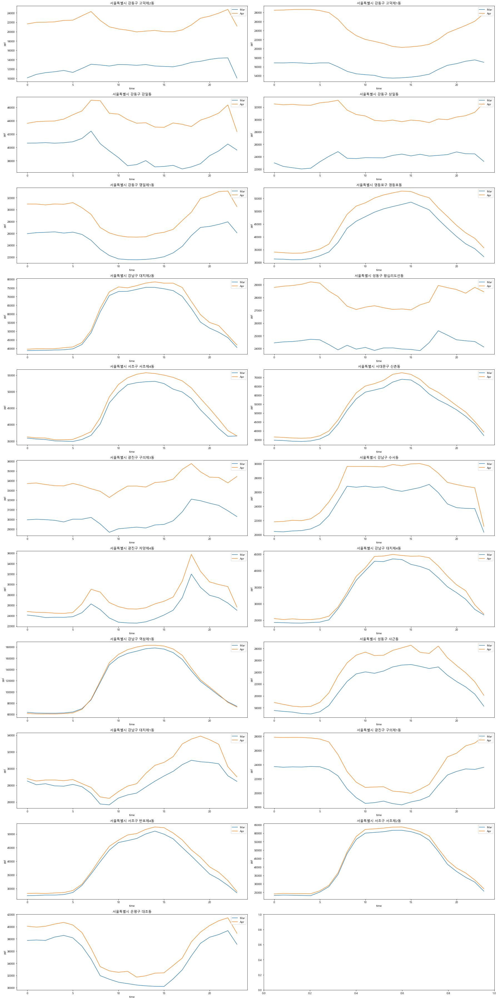

In [18]:
M = 20200309
A = 20200406

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 2주차 화요일 시간대별 생활인구 비교

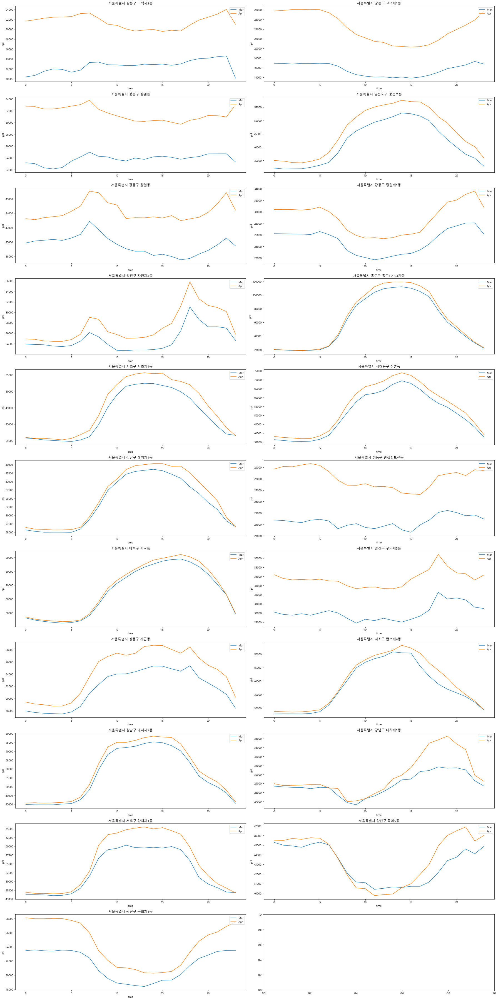

In [19]:
M = 20200310
A = 20200407

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

#### 3월/4월 2주차 수요일 시간대별 생활인구 비교

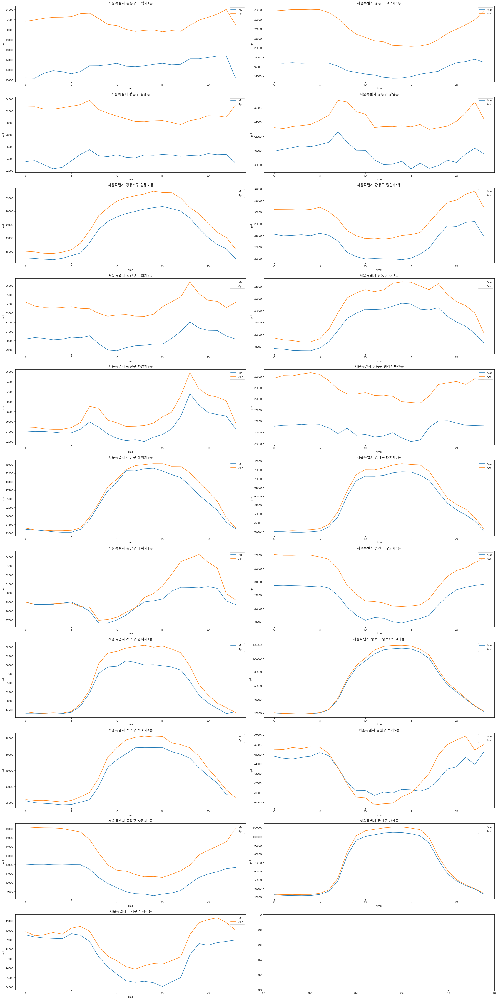

In [20]:
M = 20200311
A = 20200407

ppl_diff_fnl = ppl_diff_(M, A)
plot_ppl(ppl_diff_fnl, M, A)
ppl_map(df, ppl_diff_fnl)

## 각 행정동 별 (오후 6시 ~ 9시) 성별, 연령대 파악
- 연습 : 행정동 11680640 , 기준일 20200407

In [21]:
male_ppl = ppl[['기준일ID', '시간대구분', '행정동코드', '남자0세부터9세생활인구수', '남자10세부터14세생활인구수',
       '남자15세부터19세생활인구수', '남자20세부터24세생활인구수', '남자25세부터29세생활인구수',
       '남자30세부터34세생활인구수', '남자35세부터39세생활인구수', '남자40세부터44세생활인구수',
       '남자45세부터49세생활인구수', '남자50세부터54세생활인구수', '남자55세부터59세생활인구수',
       '남자60세부터64세생활인구수', '남자65세부터69세생활인구수', '남자70세이상생활인구수']]
female_ppl = ppl[['기준일ID', '시간대구분', '행정동코드', '여자0세부터9세생활인구수',
       '여자10세부터14세생활인구수', '여자15세부터19세생활인구수', '여자20세부터24세생활인구수',
       '여자25세부터29세생활인구수', '여자30세부터34세생활인구수', '여자35세부터39세생활인구수',
       '여자40세부터44세생활인구수', '여자45세부터49세생활인구수', '여자50세부터54세생활인구수',
       '여자55세부터59세생활인구수', '여자60세부터64세생활인구수', '여자65세부터69세생활인구수', '여자70세이상생활인구수']]
male_ppl.columns = ['기준일ID', '시간대구분', '행정동코드', '0세부터9세생활인구수', '10세부터14세생활인구수',
       '15세부터19세생활인구수', '20세부터24세생활인구수', '25세부터29세생활인구수',
       '30세부터34세생활인구수', '35세부터39세생활인구수', '40세부터44세생활인구수',
       '45세부터49세생활인구수', '50세부터54세생활인구수', '55세부터59세생활인구수',
       '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']
female_ppl.columns = ['기준일ID', '시간대구분', '행정동코드', '0세부터9세생활인구수',
       '10세부터14세생활인구수', '15세부터19세생활인구수', '20세부터24세생활인구수',
       '25세부터29세생활인구수', '30세부터34세생활인구수', '35세부터39세생활인구수',
       '40세부터44세생활인구수', '45세부터49세생활인구수', '50세부터54세생활인구수',
       '55세부터59세생활인구수', '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']

Text(0.5, 1.0, '서울특별시 광진구 자양제4동')

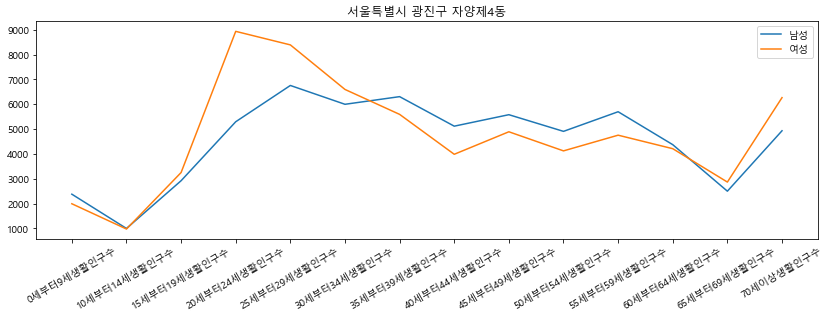

In [23]:
male_ppl_ = male_ppl[(male_ppl['행정동코드']==11215847) & (male_ppl['시간대구분'].isin([18,19,20,21])) & (male_ppl['기준일ID']==20200407) ].groupby('행정동코드').sum()
female_ppl_ = female_ppl[(female_ppl['행정동코드']==11215847) & (female_ppl['시간대구분'].isin([18,19,20,21])) & (female_ppl['기준일ID']==20200407) ].groupby('행정동코드').sum()

plt.rcParams["figure.figsize"] = (14,4)
plt.xticks(rotation=30)
plt.plot(male_ppl_.iloc[0,2:], label='남성')
plt.plot(female_ppl_.iloc[0,2:],label='여성')
plt.legend()
plt.title(loc_code[loc_code['행정동코드_'] == 11215847]['행정동명_'].values[0])

Text(0.5, 1.0, '서울특별시 광진구 자양제4동_여성')

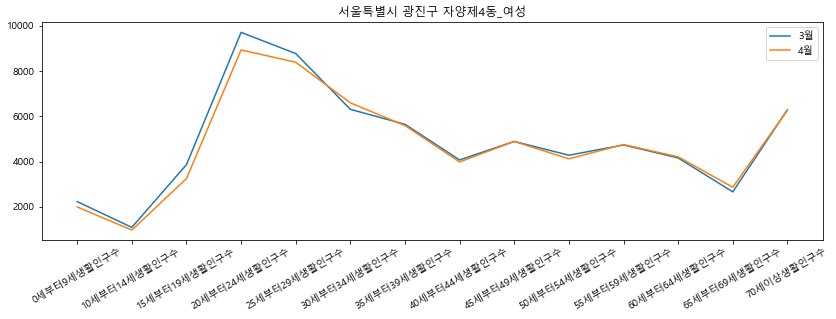

In [24]:
female_ppl_1 = female_ppl[(female_ppl['행정동코드']==11215847) & (female_ppl['시간대구분'].isin([18,19,20,21])) & (female_ppl['기준일ID']==20200331) ].groupby('행정동코드').sum()
female_ppl_2 = female_ppl[(female_ppl['행정동코드']==11215847) & (female_ppl['시간대구분'].isin([18,19,20,21])) & (female_ppl['기준일ID']==20200407) ].groupby('행정동코드').sum()

plt.rcParams["figure.figsize"] = (14,4)
plt.xticks(rotation=30)
plt.plot(female_ppl_1.iloc[0,2:], label='3월')
plt.plot(female_ppl_2.iloc[0,2:],label='4월')
plt.legend()
plt.title(loc_code[loc_code['행정동코드_'] == 11215847]['행정동명_'].values[0] + '_여성')

Text(0.5, 1.0, '서울특별시 광진구 자양제4동_남성')

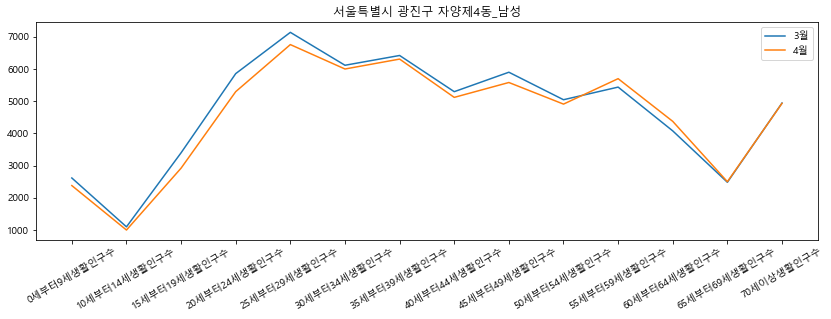

In [25]:
male_ppl_1 = male_ppl[(male_ppl['행정동코드']==11215847) & (male_ppl['시간대구분'].isin([18,19,20,21])) & (male_ppl['기준일ID']==20200331) ].groupby('행정동코드').sum()
male_ppl_2 = male_ppl[(male_ppl['행정동코드']==11215847) & (male_ppl['시간대구분'].isin([18,19,20,21])) & (male_ppl['기준일ID']==20200407) ].groupby('행정동코드').sum()

plt.rcParams["figure.figsize"] = (14,4)
plt.xticks(rotation=30)
plt.plot(male_ppl_1.iloc[0,2:], label='3월')
plt.plot(male_ppl_2.iloc[0,2:],label='4월')
plt.legend()
plt.title(loc_code[loc_code['행정동코드_'] == 11215847]['행정동명_'].values[0]+'_남성')

.

# 연습 코드

- loc_code : 시군구명, 행정동코드_, 행정동명_
- ppl : 기준일ID, 시간대구분, 행정동코드, 총생활인구수, 남여 연령대별
- df: geopandas
- male_ppl_
- female_ppl_

# 구별 생활인구 변동이 큰 행정동 상위 20% 구하기

In [210]:
def plot_gu_ppl(gu, A):
    
    fig, axes = plt.subplots(int(len(gu_dict[gu])/2)+1, 2, figsize=(25, 10))
    axes = axes.ravel()
    font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
    
    for ax in fig.axes:
        ax.tick_params(labelrotation=30)
    
    for i, dong in enumerate(gu_dict[gu].index):
        male_ppl_ = male_ppl[(male_ppl['행정동코드']==dong) & (male_ppl['시간대구분'].isin([18,19,20,21])) & (male_ppl['기준일ID']==A) ].groupby('행정동코드').sum()
        female_ppl_ = female_ppl[(female_ppl['행정동코드']==dong) & (female_ppl['시간대구분'].isin([18,19,20,21])) & (female_ppl['기준일ID']==A) ].groupby('행정동코드').sum()
#         axes[i].rcParams["figure.figsize"] = (14,4)
#         axes[i].xticks(rotation=30)
        axes[i].plot(male_ppl_.iloc[0,2:], label='남성')
        axes[i].plot(female_ppl_.iloc[0,2:],label='여성')
        axes[i].legend()
        axes[i].title.set_text(loc_code[loc_code['행정동코드_'] == dong]['행정동명_'].values[0])
        axes[i].set_xlabel('time')
        axes[i].set_ylabel('ppl')
        plt.tight_layout()

In [194]:
male_ppl = ppl[['기준일ID', '시간대구분', '행정동코드', '시군구코드', '남자0세부터9세생활인구수', '남자10세부터14세생활인구수',
       '남자15세부터19세생활인구수', '남자20세부터24세생활인구수', '남자25세부터29세생활인구수',
       '남자30세부터34세생활인구수', '남자35세부터39세생활인구수', '남자40세부터44세생활인구수',
       '남자45세부터49세생활인구수', '남자50세부터54세생활인구수', '남자55세부터59세생활인구수',
       '남자60세부터64세생활인구수', '남자65세부터69세생활인구수', '남자70세이상생활인구수']]
female_ppl = ppl[['기준일ID', '시간대구분', '행정동코드', '시군구코드', '여자0세부터9세생활인구수',
       '여자10세부터14세생활인구수', '여자15세부터19세생활인구수', '여자20세부터24세생활인구수',
       '여자25세부터29세생활인구수', '여자30세부터34세생활인구수', '여자35세부터39세생활인구수',
       '여자40세부터44세생활인구수', '여자45세부터49세생활인구수', '여자50세부터54세생활인구수',
       '여자55세부터59세생활인구수', '여자60세부터64세생활인구수', '여자65세부터69세생활인구수', '여자70세이상생활인구수']]
male_ppl.columns = ['기준일ID', '시간대구분', '행정동코드', '시군구코드', '0세부터9세생활인구수', '10세부터14세생활인구수',
       '15세부터19세생활인구수', '20세부터24세생활인구수', '25세부터29세생활인구수',
       '30세부터34세생활인구수', '35세부터39세생활인구수', '40세부터44세생활인구수',
       '45세부터49세생활인구수', '50세부터54세생활인구수', '55세부터59세생활인구수',
       '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']
female_ppl.columns = ['기준일ID', '시간대구분', '행정동코드', '시군구코드', '0세부터9세생활인구수',
       '10세부터14세생활인구수', '15세부터19세생활인구수', '20세부터24세생활인구수',
       '25세부터29세생활인구수', '30세부터34세생활인구수', '35세부터39세생활인구수',
       '40세부터44세생활인구수', '45세부터49세생활인구수', '50세부터54세생활인구수',
       '55세부터59세생활인구수', '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']

In [167]:
import json
gu = loc_code['시군구코드'].unique()
gu_dict = {}
for code in gu:
    mar = ppl[(ppl['시군구코드']==str(code)) & (ppl['기준일ID']==20200303) & (ppl['시간대구분'].isin([18,19,20,21]))]
    mar = mar.groupby('행정동코드').sum()
    apr = ppl[(ppl['시군구코드']==str(code)) & (ppl['기준일ID']==20200407) & (ppl['시간대구분'].isin([18,19,20,21]))]
    apr = apr.groupby('행정동코드').sum()
    ppl_diff = (apr['총생활인구수'] - mar['총생활인구수']).sort_values(ascending = False)
    ppl_diff_MA = ppl_diff[:int(len(ppl_diff)*.2)]
    gu_dict[loc_code[loc_code['시군구코드']==str(code)]['시군구명'].unique()[0]] = ppl_diff_MA

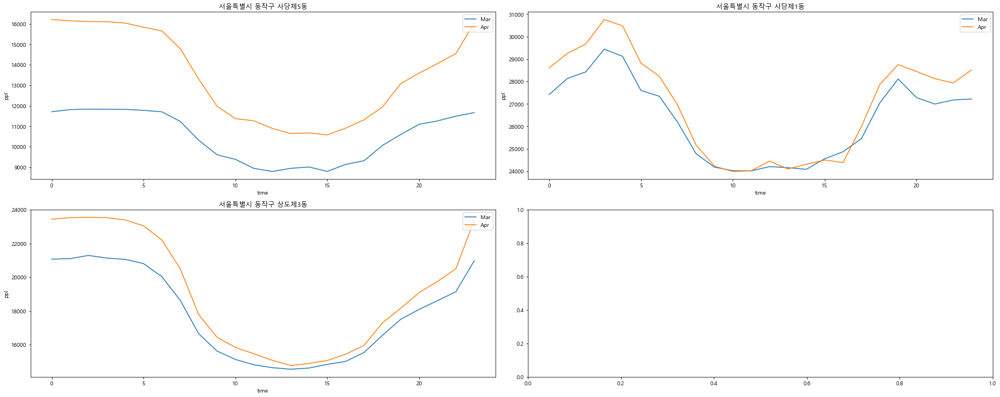

In [222]:
plot_ppl(gu_dict['동작구'], 20200303, 20200407)
ppl_map(df, gu_dict['동작구'])

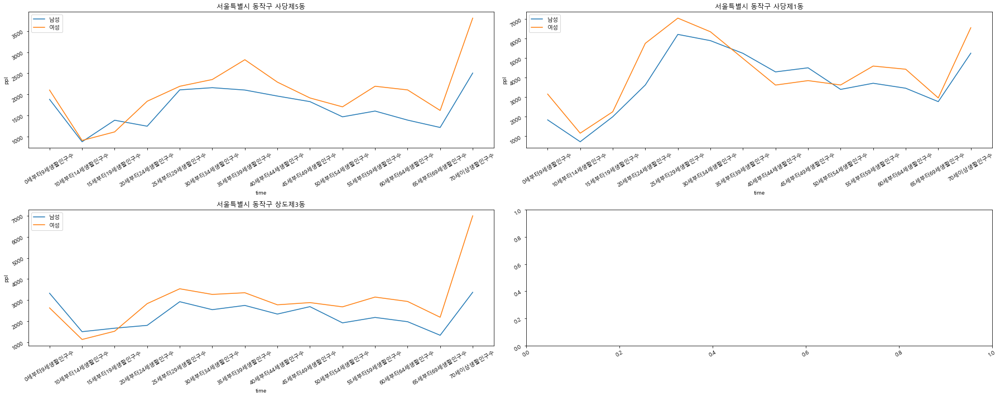

In [248]:
plot_gu_ppl('동작구', 20200407)

In [249]:
gu_dict['동작구']

행정동코드
11590651    9660
11590620    3765
11590550    3532
Name: 총생활인구수, dtype: int64

## 연습_상권 매출 데이터 이용하여 각 행정동 주 매출 서비스 파악

In [303]:
main_service = csm[csm['상권_코드'].isin(mkt[mkt['행정동코드']==11590620]['상권코드'].values)].copy()
main_service.sort_values('시간대_17~21_매출_금액', ascending=False)['서비스_업종_코드_명'].head(40).value_counts().head()

편의점        5
한식음식점      4
의약·의료용품    2
치과의원       2
의류점        2
Name: 서비스_업종_코드_명, dtype: int64

In [231]:
main_service.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 45924 to 62484
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   기준_년_코드          93 non-null     int64  
 1   기준_분기_코드         93 non-null     int64  
 2   상권_구분_코드         93 non-null     object 
 3   상권_구분_코드_명       93 non-null     object 
 4   상권_코드            93 non-null     int64  
 5   상권_코드_명          93 non-null     object 
 6   서비스_업종_코드        93 non-null     object 
 7   서비스_업종_코드_명      93 non-null     object 
 8   당월_매출_금액         93 non-null     int64  
 9   당월_매출_건수         93 non-null     int64  
 10  주중_매출_비율         93 non-null     int64  
 11  주말_매출_비율         93 non-null     int64  
 12  월요일_매출_비율        93 non-null     int64  
 13  화요일_매출_비율        93 non-null     int64  
 14  수요일_매출_비율        93 non-null     int64  
 15  목요일_매출_비율        93 non-null     int64  
 16  금요일_매출_비율        93 non-null     int64  
 17  토요일_매출_비율  

In [257]:
ppl_1904 = pd.read_csv('dataset/LOCAL_PEOPLE_DONG_201904/LOCAL_PEOPLE_DONG_201904.csv', encoding='utf-8')

In [259]:
col_names = ppl_1904.columns
ppl_1904 = ppl_1904.reset_index()
ppl_1904 = ppl_1904.iloc[:,:len(col_names)]
ppl_1904.columns = col_names
ppl_1904_ = ppl_1904.copy().round().astype('int64')

ppl_1904_.head()

,기준일ID,시간대구분,행정동코드,총생활인구수,남자0세부터9세생활인구수,남자10세부터14세생활인구수,남자15세부터19세생활인구수,남자20세부터24세생활인구수,남자25세부터29세생활인구수,남자30세부터34세생활인구수,...,여자25세부터29세생활인구수,여자30세부터34세생활인구수,여자35세부터39세생활인구수,여자40세부터44세생활인구수,여자45세부터49세생활인구수,여자50세부터54세생활인구수,여자55세부터59세생활인구수,여자60세부터64세생활인구수,여자65세부터69세생활인구수,여자70세이상생활인구수
0,20190401,0,11305555,28876,936,518,600,709,920,860,...,935,851,1044,974,1224,1188,1292,1122,928,2908
1,20190401,0,11320511,24891,679,408,586,633,776,720,...,858,998,955,892,1211,1041,1114,1238,730,2173
2,20190401,0,11500550,17481,733,333,379,370,503,756,...,581,783,841,771,691,562,762,714,602,1178
3,20190401,0,11320513,14025,547,305,406,361,423,384,...,406,364,568,549,635,645,621,481,402,1443
4,20190401,0,11620775,22754,521,308,617,693,785,854,...,791,803,778,751,903,906,1138,840,700,1905


In [298]:
prac = ppl_1904_[(ppl_1904_['행정동코드']==11590651) & (ppl_1904_['기준일ID']==20190402) & (ppl_1904_['시간대구분'].isin([18,19,20,21]))].copy()

In [299]:
male_ = prac[['기준일ID', '시간대구분', '행정동코드',  '남자0세부터9세생활인구수', '남자10세부터14세생활인구수',
       '남자15세부터19세생활인구수', '남자20세부터24세생활인구수', '남자25세부터29세생활인구수',
       '남자30세부터34세생활인구수', '남자35세부터39세생활인구수', '남자40세부터44세생활인구수',
       '남자45세부터49세생활인구수', '남자50세부터54세생활인구수', '남자55세부터59세생활인구수',
       '남자60세부터64세생활인구수', '남자65세부터69세생활인구수', '남자70세이상생활인구수']]
female_ = prac[['기준일ID', '시간대구분', '행정동코드',  '여자0세부터9세생활인구수',
       '여자10세부터14세생활인구수', '여자15세부터19세생활인구수', '여자20세부터24세생활인구수',
       '여자25세부터29세생활인구수', '여자30세부터34세생활인구수', '여자35세부터39세생활인구수',
       '여자40세부터44세생활인구수', '여자45세부터49세생활인구수', '여자50세부터54세생활인구수',
       '여자55세부터59세생활인구수', '여자60세부터64세생활인구수', '여자65세부터69세생활인구수', '여자70세이상생활인구수']]
male_.columns = ['기준일ID', '시간대구분', '행정동코드',  '0세부터9세생활인구수', '10세부터14세생활인구수',
       '15세부터19세생활인구수', '20세부터24세생활인구수', '25세부터29세생활인구수',
       '30세부터34세생활인구수', '35세부터39세생활인구수', '40세부터44세생활인구수',
       '45세부터49세생활인구수', '50세부터54세생활인구수', '55세부터59세생활인구수',
       '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']
female_.columns = ['기준일ID', '시간대구분', '행정동코드',  '0세부터9세생활인구수',
       '10세부터14세생활인구수', '15세부터19세생활인구수', '20세부터24세생활인구수',
       '25세부터29세생활인구수', '30세부터34세생활인구수', '35세부터39세생활인구수',
       '40세부터44세생활인구수', '45세부터49세생활인구수', '50세부터54세생활인구수',
       '55세부터59세생활인구수', '60세부터64세생활인구수', '65세부터69세생활인구수', '70세이상생활인구수']

In [300]:
male_1 = male_.groupby('행정동코드').sum().iloc[:,2:]
female_1 = female_.groupby('행정동코드').sum().iloc[:,2:]


In [301]:
female_1

,0세부터9세생활인구수,10세부터14세생활인구수,15세부터19세생활인구수,20세부터24세생활인구수,25세부터29세생활인구수,30세부터34세생활인구수,35세부터39세생활인구수,40세부터44세생활인구수,45세부터49세생활인구수,50세부터54세생활인구수,55세부터59세생활인구수,60세부터64세생활인구수,65세부터69세생활인구수,70세이상생활인구수
행정동코드,,,,,,,,,,,,,,
11590651,1092,470,1069,1507,1262,1251,1600,1377,1200,1147,1495,1458,1135,2454


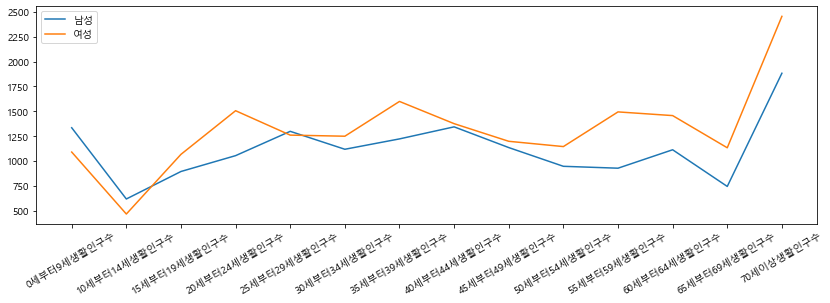

In [302]:
plt.rcParams["figure.figsize"] = (14,4)
plt.xticks(rotation=30)
plt.plot(male_1.T, label= '남성')
plt.plot(female_1.T, label='여성')
plt.legend()

## 연습코드

In [28]:
f_ppl = pd.read_csv('dataset/상권추정유동인구/서울시 우리마을가게 상권분석서비스(상권-추정유동인구).csv', encoding='euc-kr')
f_ppl = f_ppl[(f_ppl['기준_분기_코드']==2) & (f_ppl['기준 년코드']==2019)]
f_ppl = f_ppl[['상권_코드', '시간대_5_유동인구_수', 
               '남성연령대_10_월요일시간대_5_유동인구_수', '남성연령대_20_월요일시간대_5_유동인구_수',
               '남성연령대_30_월요일시간대_5_유동인구_수', '남성연령대_40_월요일시간대_5_유동인구_수',
               '남성연령대_50_월요일시간대_5_유동인구_수', '남성연령대_60_이상_월요일시간대_5_유동인구_수',
               '여성연령대_10_월요일시간대_5_유동인구_수', '여성연령대_20_월요일시간대_5_유동인구_수',
               '여성연령대_30_월요일시간대_5_유동인구_수', '여성연령대_40_월요일시간대_5_유동인구_수',
               '여성연령대_50_월요일시간대_5_유동인구_수', '여성연령대_60_이상_월요일시간대_5_유동인구_수']]


In [29]:
f_ppl['10대_월'] = f_ppl['남성연령대_10_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_10_월요일시간대_5_유동인구_수']
f_ppl['20대_월'] = f_ppl['남성연령대_20_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_20_월요일시간대_5_유동인구_수']
f_ppl['30대_월'] = f_ppl['남성연령대_30_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_30_월요일시간대_5_유동인구_수']
f_ppl['40대_월'] = f_ppl['남성연령대_40_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_40_월요일시간대_5_유동인구_수']
f_ppl['50대_월'] = f_ppl['남성연령대_50_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_50_월요일시간대_5_유동인구_수']
f_ppl['60대_월'] = f_ppl['남성연령대_60_이상_월요일시간대_5_유동인구_수'] + f_ppl['여성연령대_60_이상_월요일시간대_5_유동인구_수']

In [30]:
f_ppl = f_ppl.drop(['남성연령대_10_월요일시간대_5_유동인구_수', '남성연령대_20_월요일시간대_5_유동인구_수',
               '남성연령대_30_월요일시간대_5_유동인구_수', '남성연령대_40_월요일시간대_5_유동인구_수',
               '남성연령대_50_월요일시간대_5_유동인구_수', '남성연령대_60_이상_월요일시간대_5_유동인구_수',
               '여성연령대_10_월요일시간대_5_유동인구_수', '여성연령대_20_월요일시간대_5_유동인구_수',
               '여성연령대_30_월요일시간대_5_유동인구_수', '여성연령대_40_월요일시간대_5_유동인구_수',
               '여성연령대_50_월요일시간대_5_유동인구_수', '여성연령대_60_이상_월요일시간대_5_유동인구_수'], axis = 1)

In [31]:
f_ppl

,상권_코드,시간대_5_유동인구_수,10대_월,20대_월,30대_월,40대_월,50대_월,60대_월
1495,1001496,19500,108,864,722,440,244,152
1496,1001495,590037,2935,23186,18096,12628,10652,7829
1497,1001494,1350139,6921,58000,38788,28754,26562,23205
1498,1001493,546852,2276,23146,18283,12836,12517,9041
1499,1001492,1405084,4284,56504,53240,38048,26736,16744
...,...,...,...,...,...,...,...,...
2985,1000005,9228,4,244,175,168,140,73
2986,1000004,91746,2241,9109,1130,773,715,670
2987,1000003,40430,122,1304,1156,932,982,794
2988,1000002,54354,254,1262,1319,1123,1353,1342


In [218]:
f_ppl[f_ppl['상권_코드'].isin(mkt[mkt['행정동코드']==11680640]['상권코드'].values)]

,상권_코드,시간대_5_유동인구_수,10대_월,20대_월,30대_월,40대_월,50대_월,60대_월
1901,1001089,55700,98,2344,2999,1900,996,636
1903,1001087,179708,239,7148,8448,5947,4367,3097
1905,1001085,1353051,9386,88289,42212,21168,12617,8664
1909,1001081,177700,341,7484,8090,5773,3384,1892
1917,1001073,249016,432,11874,12927,8344,4807,3301
1924,1001066,469863,6705,25959,17004,10787,6422,4202
1932,1001058,72481,271,3230,3642,2177,1185,801
1938,1001052,131689,393,5756,7340,4643,2368,1273
2088,1000902,45491,278,1590,1978,1605,1016,676
2096,1000894,78399,140,3552,4192,2225,1346,976


## 각 행정동의 상권 별 주 매출 서비스 분야 파악

#### 상권 영역 확인

In [213]:
mkt = pd.read_csv('dataset/서울시 우리마을가게 상권분석서비스(상권영역).csv', encoding='euc-kr')
mkt = mkt[['상권_코드_명', '상권_구분_코드_명', '상권_코드','행정동_코드']]
mkt.columns = ['상권명', '상권구분', '상권코드','행정동코드']

#### 상권 별 매출건수/점포수 정렬

In [214]:
csm = pd.read_csv('dataset/서울시 우리마을가게 상권분석서비스(상권-추정매출)_2019.csv', encoding = 'euc-kr')
csm = csm[csm['기준_분기_코드']==2]
csm = csm[~csm['상권_코드'].str.contains('^re', regex=True, na=False)]
csm['상권_코드'] = csm['상권_코드'].astype('int64')

C:\Users\mb910\Anaconda3\envs\covid\lib\site-packages\IPython\core\interactiveshell.py:3062: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [215]:
csm[csm['상권_코드'].isin(mkt[mkt['행정동코드']==11680640]['상권코드'].values)].head()

,기준_년_코드,기준_분기_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권_코드_명,서비스_업종_코드,서비스_업종_코드_명,당월_매출_금액,당월_매출_건수,...,시간대_건수~24_매출_건수,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,점포수
49054,2019,2,A,골목상권,1000894,논현로106길,CS100001,한식음식점,1730146315,33473,...,1600,14883,10217,8,4997,8764,5229,3625,2477,19
49055,2019,2,A,골목상권,1000894,논현로106길,CS100003,일식음식점,140279795,433,...,155,72,155,0,0,20,134,62,10,1
49056,2019,2,A,골목상권,1000894,논현로106길,CS100005,분식전문점,216241031,9944,...,1954,3049,4897,21,2577,2984,1610,430,321,4
49057,2019,2,A,골목상권,1000894,논현로106길,CS100006,패스트푸드점,268070692,9755,...,1782,5735,2759,114,3713,2100,1329,1055,182,1
49058,2019,2,A,골목상권,1000894,논현로106길,CS100008,제과점,231465269,7432,...,94,2883,3919,7,1680,2346,1500,740,530,1


In [216]:
tmp = csm[csm['상권_코드'].isin(mkt[mkt['행정동코드']==11680640]['상권코드'].values)]
tmp = tmp[['상권_코드', '상권_코드_명', '서비스_업종_코드_명', '시간대_건수~21_매출_건수', '점포수']]
tmp.columns = ['상권코드', '상권코드명', '서비스업종코드명', '매출건수', '점포수']
tmp['매출건수/점포수'] = tmp['매출건수'] / tmp['점포수']
tmp['상권코드명'].unique()

array(['논현로106길', '논현로63길', '뱅뱅사거리_2', '역삼역_1', '서울 강남구 강남역',
       '서울 강남구 역삼역_1', '서울 강남구 역삼역_2', '서울 서초구 강남역', '서울 강남구 선릉역_2',
       '삼정역_1'], dtype=object)

In [217]:
# 각 행정동의 주 매출 서비스 분야

for cm in tmp['상권코드명'].unique():
    tmp_1 = tmp[tmp['상권코드명']==cm].sort_values('매출건수/점포수', ascending=False)
    tmp_1 = tmp_1[:int(len(tmp_1)*.2)]
    service = tmp_1['서비스업종코드명'].values
    print(cm, ':', service)

논현로106길 : ['편의점' '패스트푸드점' '제과점' '분식전문점']
논현로63길 : ['제과점' '편의점' 'PC방' '식료품' '양식음식점' '한의원']
뱅뱅사거리_2 : ['편의점' '슈퍼마켓' '제과점' '의약·의료용품' '분식전문점' '중식음식점' '커피·음료']
역삼역_1 : ['숙박업' '편의점' 'PC방' '의약·의료용품' '치킨전문점' '제과점']
서울 강남구 강남역 : ['섬유제품' '편의점' '제과점' 'PC방' '중식음식점' '패스트푸드점' '의약·의료용품' '패션용품']
서울 강남구 역삼역_1 : ['편의점' '제과점' '슈퍼마켓' '서적·문구' '패스트푸드점' '커피·음료' '분식전문점' '의약·의료용품']
서울 강남구 역삼역_2 : ['편의점' '슈퍼마켓' '제과점' 'PC방' '커피·음료' '중식음식점' '분식전문점']
서울 서초구 강남역 : ['편의점' 'PC방' '패스트푸드점' '커피·음료' '의약·의료용품' '분식전문점' '서적·문구' '제과점']
서울 강남구 선릉역_2 : ['커피·음료' '편의점' '슈퍼마켓' '의약·의료용품' '치킨전문점' '분식전문점']
삼정역_1 : ['서적·문구' '편의점' '의약·의료용품']


# 연습